# Wellbore Fracture Segmentation

### Implemented by Kimia Vanaei

## Objective

The objective is to isolate the **primary structural fractures** from thin micro-cracks, background texture, and acquisition artifacts in unwrapped wellbore images.

A primary fracture should be:

- thicker than the surrounding secondary cracks
- smooth and curvilinear
- horizontally continuous across most or all of the unwrapped image

The implemented pipeline has four stages:

1. **Preprocessing:** grayscale conversion, contrast normalization, CLAHE, and smoothing.
2. **Edge and ridge enhancement:** multiscale morphological ridge responses guided by Sobel derivatives.
3. **Morphological thickness selection:** narrow responses are reduced before continuity analysis.
4. **Continuity verification:** smooth full-width paths are detected using dynamic programming, after which the visible fracture thickness is reconstructed locally.

All spatial parameters are scaled according to the image dimensions. Therefore, the same functions can process both the high-resolution `graded` images and the smaller images in the `validation` folder.

This implementation uses only NumPy, SciPy, Matplotlib, and OpenCV.

The cell below, automatically clones the repository and loads the provided images from the data directory.

In [3]:
from pathlib import Path

REPO_DIR = Path("/content/wellbore-fracture-segmentation")

if not REPO_DIR.exists():
    !git clone --no-checkout --depth 1 --sparse https://github.com/KimiaVanaei/wellbore-fracture-segmentation.git {REPO_DIR}
    !cd {REPO_DIR} && git sparse-checkout set --no-cone "data/" "/requirements.txt"
    !cd {REPO_DIR} && git checkout

PROJECT_DIR = REPO_DIR

DATA_DIR = PROJECT_DIR / "data"
GRADED_DIR = DATA_DIR / "graded"
VALIDATION_DIR = DATA_DIR / "validation"

OUTPUT_DIR = PROJECT_DIR / "outputs"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

REQUIREMENTS_FILE = PROJECT_DIR / "requirements.txt"
if REQUIREMENTS_FILE.exists():
    print("Installing requirements...")
    !pip install -r {REQUIREMENTS_FILE} -q

print("Project ready:", PROJECT_DIR)

Installing requirements...
Project ready: /content/wellbore-fracture-segmentation



Image directory: /content/wellbore-fracture-segmentation/data
Images found: 10 (2 graded, 8 validation)

Graded     | Well1.jpg       | (654, 2561, 3)
Graded     | well2.png       | (603, 2563, 3)
Validation | 0153.png        | (360, 640, 3)
Validation | 0170.png        | (360, 640, 3)
Validation | 0176.png        | (360, 640, 3)
Validation | 0179.png        | (360, 640, 3)
Validation | 0185.png        | (360, 640, 3)
Validation | 0188.png        | (360, 640, 3)
Validation | 0190.png        | (360, 640, 3)
Validation | 0197.png        | (360, 640, 3)


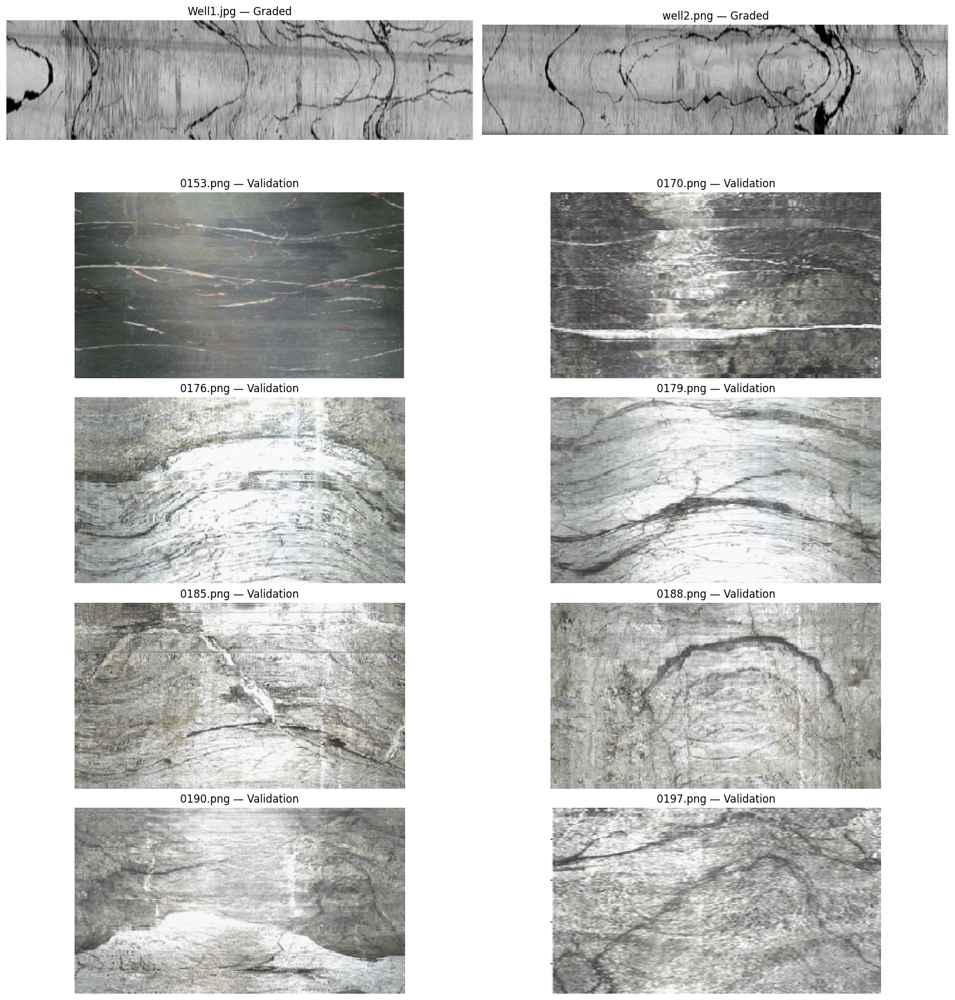

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
import math
import shutil


# Discover all supplied images
image_extensions = {
    '.jpg', '.jpeg', '.png',
    '.bmp', '.tif', '.tiff',
}

for required_dir in (GRADED_DIR, VALIDATION_DIR):
    if not required_dir.exists():
        raise FileNotFoundError(
            f'Required image directory was not found: {required_dir}'
        )

image_paths = [
    path
    for image_dir in (GRADED_DIR, VALIDATION_DIR)
    for path in image_dir.rglob("*")
    if (
        path.is_file()
        and path.suffix.lower() in image_extensions
        and "__MACOSX" not in path.parts
    )
]


def image_priority(path):
    """Place the two graded images before the validation images."""
    name = path.name.lower()

    if name == 'well1.jpg':
        return 0, name
    if name == 'well2.png':
        return 1, name
    return 2, name


image_paths = sorted(image_paths, key=image_priority)
if not image_paths:
    raise FileNotFoundError(
        'No supported wellbore images were found inside the repository data folders.'
    )


# Load images in RGB format
def load_rgb(path):
    image_bgr = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if image_bgr is None:
        raise ValueError(f'OpenCV could not read the image: {path}')
    return cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)


image_records = []

for path in image_paths:
    group = (
        'Graded'
        if GRADED_DIR in path.parents
        else 'Validation'
    )
    image_records.append({
        'name': path.name,
        'path': path,
        'group': group,
        'rgb': load_rgb(path),
    })


graded_images = [
    record
    for record in image_records
    if record['group'] == 'Graded'
]

validation_images = [
    record
    for record in image_records
    if record['group'] == 'Validation'
]

# Print image information
print(f'\nImage directory: {DATA_DIR}')
print(
    f'Images found: {len(image_records)} '
    f'({len(graded_images)} graded, '
    f'{len(validation_images)} validation)\n'
)

for record in image_records:
    print(
        f"{record['group']:10s} | "
        f"{record['name']:15s} | "
        f"{record['rgb'].shape}"
    )


# Display all discovered images
columns = 2
rows = math.ceil(len(image_records) / columns)
fig, axes = plt.subplots(
    rows,
    columns,
    figsize=(15, 3.2 * rows),
    constrained_layout=True,
)
axes = np.asarray(axes).reshape(-1)

for ax, record in zip(axes, image_records):
    ax.imshow(record['rgb'])
    ax.set_title(
        f"{record['name']} — {record['group']}"
    )
    ax.axis('off')

for ax in axes[len(image_records):]:
    ax.axis('off')

plt.show()

## Preprocessing

Direct processing of the original images is unreliable because their intensity ranges, illumination conditions, and noise levels are different. Preprocessing is therefore applied before ridge detection.

The following operations are used:

- **Grayscale conversion:** reduces the image to one intensity channel.
- **Percentile normalization:** maps the central intensity range to `[0, 255]` while limiting the effect of unusually dark or bright pixels.
- **Median filtering:** suppresses isolated speckle without strongly blurring fracture boundaries.
- **CLAHE:** improves local contrast while limiting excessive amplification in textured regions.
- **Gaussian smoothing:** reduces small intensity fluctuations and stabilizes the later morphological response.

The enhancement is intentionally moderate. Stronger CLAHE settings produced more visible texture but also increased false fracture evidence, particularly in the additional validation images.

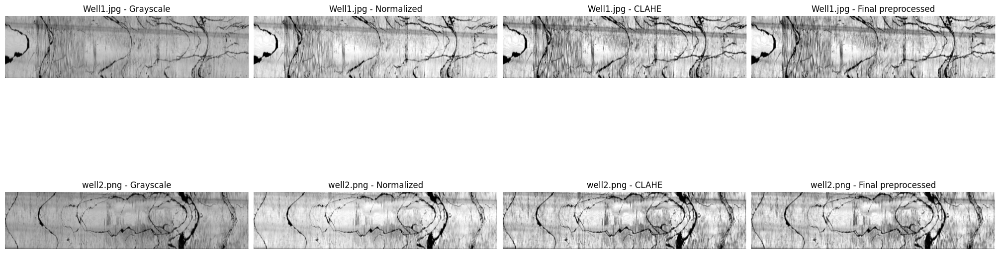

In [5]:
def preprocess_image(image_rgb):
    """Return the main preprocessing stages for one RGB image."""
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)

    lower, upper = np.percentile(gray, (1, 99))
    normalized = np.clip(
        (gray.astype(np.float32) - lower) * 255.0 / max(upper - lower, 1e-6),
        0,
        255,
    ).astype(np.uint8)

    median_filtered = cv2.medianBlur(normalized, 3)
    clahe = cv2.createCLAHE(clipLimit=1.4, tileGridSize=(8, 8))
    enhanced = clahe.apply(median_filtered)
    preprocessed = cv2.GaussianBlur(enhanced, (5, 5), 0)

    return {
        "gray": gray,
        "normalized": normalized,
        "enhanced": enhanced,
        "preprocessed": preprocessed,
    }


for record in image_records:
    record["preprocessing"] = preprocess_image(record["rgb"])

stage_keys = ["gray", "normalized", "enhanced", "preprocessed"]
stage_titles = ["Grayscale", "Normalized", "CLAHE", "Final preprocessed"]

fig, axes = plt.subplots(len(graded_images), 4, figsize=(20, 7), constrained_layout=True)
for row, record in enumerate(graded_images):
    for column, (key, title) in enumerate(zip(stage_keys, stage_titles)):
        axes[row, column].imshow(record["preprocessing"][key], cmap="gray", vmin=0, vmax=255)
        axes[row, column].set_title(f"{record['name']} - {title}")
        axes[row, column].axis("off")
plt.show()

## 2.2 Ridge Enhancement and Morphological Thickness Selection

A primary fracture must have both a strong local ridge response and long-range horizontal continuity. Detecting only edges would also select many short micro-cracks, while directly thresholding the image would be sensitive to illumination changes.

Dark and bright structures are therefore processed separately:

- a **black-hat transform** highlights dark structures relative to their local background.
- a **white top-hat transform** highlights bright structures.

Three adaptive structuring-element sizes are used because fracture thickness varies between images and within the same image. The maximum response across the scales is retained.

A grayscale morphological opening is then applied to the ridge response. Narrow responses are weakened more strongly than thick responses, which helps suppress thin secondary cracks before path tracking. A weighted combination of the original and opened responses preserves weaker sections of a primary fracture while still favoring thicker structures.

To reduce vertical acquisition artifacts, every response column is centered by its median and scaled using its own 95th percentile. Sobel derivatives are also calculated. The gradient direction gives a higher weight to horizontal and oblique structures and a lower weight to nearly vertical striping.

For a ridge response $R(y,x)$, the normalized evidence is conceptually written as

$$
S(y,x)=
\operatorname{clip}
\left(
\frac{R(y,x)-\operatorname{median}_y R(y,x)}
{P_{95,y}(R(y,x))-\operatorname{median}_y R(y,x)+\epsilon},
0,3
\right)
$$

### Continuity Verification

Connected-component filtering can fail when nearby cracks join into one large noisy component. Instead, continuity is tested directly using dynamic programming.

Each candidate path must cross from the first image column to the last. Between adjacent columns, it may move upward by one pixel, remain at the same row, or move downward by one pixel. The state also stores the previous vertical step, allowing the algorithm to penalize sudden changes in slope.

The recurrence has the form

$$
D_s(y,x)=E(y,x)+
\max_{s'\in\{-1,0,1\}}
\left[
D_{s'}(y-s,x-1)
-\lambda_1|s|
-\lambda_2|s-s'|
\right]
$$

where $E(y,x)$ is the ridge evidence, $s$ is the current vertical step, and $s'$ is the previous step. The first penalty favors smooth paths, while the second discourages abrupt changes of direction.

After detecting one path, a narrow band around it is suppressed before searching for another one. A path is accepted only when it has:

- a sufficient average dynamic-programming score
- enough locally supported columns
- no excessively long unsupported interval

Dark and bright paths are evaluated independently, and the polarity with the stronger supported paths is selected for each image.

In [6]:
def make_odd(value, minimum=3):
    """Convert a numeric size to an odd integer no smaller than minimum."""
    value = max(minimum, int(round(value)))
    return value if value % 2 else value + 1


def longest_false_run(values):
    """Return the longest consecutive run of False values."""
    longest = current = 0
    for value in values:
        if value:
            current = 0
        else:
            current += 1
            longest = max(longest, current)
    return longest


def build_ridge_evidence(preprocessed, polarity):
    """Build Sobel-guided multiscale ridge evidence for one polarity."""
    height, width = preprocessed.shape
    operation = cv2.MORPH_BLACKHAT if polarity == "dark" else cv2.MORPH_TOPHAT

    scale_fractions = [
        (0.020, 0.025),
        (0.035, 0.045),
        (0.055, 0.070),
    ]

    responses = []
    kernel_sizes = []
    for width_fraction, height_fraction in scale_fractions:
        kernel_width = make_odd(width_fraction * width, minimum=9)
        kernel_height = make_odd(height_fraction * height, minimum=7)
        kernel = cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE,
            (kernel_width, kernel_height),
        )
        responses.append(
            cv2.morphologyEx(preprocessed, operation, kernel).astype(np.float32)
        )
        kernel_sizes.append((kernel_width, kernel_height))

    raw_response = np.maximum.reduce(responses)

    # Grayscale opening suppresses responses narrower than the structuring element.
    opening_size = 3 if min(height, width) < 900 else 5
    opening_kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (opening_size, opening_size),
    )
    thick_response = cv2.morphologyEx(
        raw_response.astype(np.uint8),
        cv2.MORPH_OPEN,
        opening_kernel,
    ).astype(np.float32)

    # Retain some weak continuity while emphasizing morphologically thick responses.
    selected_response = 0.35 * raw_response + 0.65 * thick_response

    column_median = np.median(selected_response, axis=0, keepdims=True)
    column_upper = np.percentile(selected_response, 95, axis=0, keepdims=True)
    normalized = np.clip(
        (selected_response - column_median) / (column_upper - column_median + 2.0),
        0,
        3,
    )

    image_float = preprocessed.astype(np.float32) / 255.0
    gradient_x = cv2.Sobel(image_float, cv2.CV_32F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(image_float, cv2.CV_32F, 0, 1, ksize=3)
    gradient_magnitude = np.hypot(gradient_x, gradient_y)

    positive_gradients = gradient_magnitude[gradient_magnitude > 0]
    gradient_scale = (
        np.percentile(positive_gradients, 95)
        if positive_gradients.size
        else 1.0
    )
    edge_strength = np.clip(gradient_magnitude / max(gradient_scale, 1e-6), 0, 1)

    horizontal_preference = np.abs(gradient_y) / (
        np.abs(gradient_x) + np.abs(gradient_y) + 1e-6
    )

    # Sobel orientation guides the ridge evidence. The magnitude is kept
    # as a diagnostic stage instead of strongly attenuating low-contrast
    # fracture sections.
    evidence = normalized * (0.35 + 0.65 * horizontal_preference)
    evidence = ndimage.gaussian_filter(evidence, sigma=(1.2, 1.0))

    border_margin = max(3, int(round(0.015 * height)))
    evidence[:border_margin, :] = -2.0
    evidence[-border_margin:, :] = -2.0

    return {
        "raw_response": raw_response,
        "thick_response": thick_response,
        "sobel_strength": edge_strength,
        "evidence": evidence.astype(np.float32),
        "kernel_sizes": kernel_sizes,
        "opening_size": opening_size,
    }


def strongest_smooth_path(evidence, step_penalty=0.30, curvature_penalty=0.18):
    """Find the strongest left-to-right path with slope-change regularization."""
    height, width = evidence.shape
    slopes = [-1, 0, 1]
    number_of_slopes = len(slopes)
    impossible = -1e9

    scores = np.full((number_of_slopes, height), impossible, dtype=np.float32)
    for slope_index in range(number_of_slopes):
        scores[slope_index] = evidence[:, 0]

    previous_slope = np.zeros((width, number_of_slopes, height), dtype=np.int8)

    for column in range(1, width):
        updated_scores = np.full_like(scores, impossible)

        for slope_index, slope in enumerate(slopes):
            if slope >= 0:
                current_rows = slice(slope, height)
                earlier_rows = slice(0, height - slope)
            else:
                current_rows = slice(0, height + slope)
                earlier_rows = slice(-slope, height)

            candidates = np.stack([
                scores[earlier_slope, earlier_rows]
                - step_penalty * abs(slope)
                - curvature_penalty * abs(slope - slopes[earlier_slope])
                for earlier_slope in range(number_of_slopes)
            ])

            best_earlier_slope = np.argmax(candidates, axis=0)
            best_values = candidates[
                best_earlier_slope,
                np.arange(candidates.shape[1]),
            ]

            updated_scores[slope_index, current_rows] = (
                best_values + evidence[current_rows, column]
            )
            previous_slope[column, slope_index, current_rows] = (
                best_earlier_slope.astype(np.int8)
            )

        scores = updated_scores

    slope_index, final_row = np.unravel_index(np.argmax(scores), scores.shape)
    path_rows = np.empty(width, dtype=np.int32)
    path_rows[-1] = final_row

    for column in range(width - 1, 0, -1):
        slope = slopes[slope_index]
        path_rows[column - 1] = path_rows[column] - slope
        slope_index = int(previous_slope[column, slope_index, path_rows[column]])

    average_score = float(np.max(scores) / width)
    return path_rows, average_score


def evaluate_path(evidence, path_rows):
    """Measure local support for a full-width path."""
    width = evidence.shape[1]
    path_values = evidence[path_rows, np.arange(width)]
    positive = evidence[evidence > 0]

    support_threshold = max(
        0.18,
        0.45 * np.percentile(positive, 65) if positive.size else 0.18,
    )
    strong_threshold = max(
        0.50,
        np.percentile(positive, 85) if positive.size else 0.50,
    )

    supported = path_values >= support_threshold
    strong = path_values >= strong_threshold

    return {
        "rows": path_rows,
        "mean_evidence": float(np.mean(path_values)),
        "support_fraction": float(np.mean(supported)),
        "strong_fraction": float(np.mean(strong)),
        "maximum_weak_gap": longest_false_run(supported) / width,
        "vertical_range": (int(path_rows.min()), int(path_rows.max())),
    }


def trace_multiple_paths(evidence, maximum_tested=5, maximum_retained=3):
    """Extract, score, and select several distinct full-width paths."""
    height, _ = evidence.shape
    working = evidence.copy()
    row_grid = np.arange(height)[:, None]
    suppression_radius = max(8, int(round(0.035 * height)))
    tested_paths = []

    for _ in range(maximum_tested):
        path_rows, dp_score = strongest_smooth_path(working)
        path_information = evaluate_path(evidence, path_rows)
        path_information["dp_score"] = dp_score
        tested_paths.append(path_information)

        suppression_band = np.abs(row_grid - path_rows[None, :]) <= suppression_radius
        working[suppression_band] = -4.0

    if not tested_paths:
        return {"tested": [], "retained": [], "suppression_radius": suppression_radius}

    first_score = tested_paths[0]["dp_score"]
    retained_paths = []

    for index, path_information in enumerate(tested_paths):
        if index == 0:
            accepted = (
                path_information["dp_score"] >= 0.38
                and path_information["support_fraction"] >= 0.45
                and path_information["maximum_weak_gap"] <= 0.20
            )
        else:
            accepted = (
                path_information["dp_score"] >= max(0.42, 0.62 * first_score)
                and path_information["support_fraction"] >= 0.42
                and path_information["maximum_weak_gap"] <= 0.22
            )

        if accepted:
            retained_paths.append(path_information)
        if len(retained_paths) >= maximum_retained:
            break

    return {
        "tested": tested_paths,
        "retained": retained_paths,
        "suppression_radius": suppression_radius,
    }


def select_polarity(dark_paths, bright_paths):
    """Choose the polarity with stronger and better-supported leading paths."""
    dark_quality = sum(
        path["dp_score"] * path["support_fraction"]
        for path in dark_paths["tested"][:2]
    )
    bright_quality = sum(
        path["dp_score"] * path["support_fraction"]
        for path in bright_paths["tested"][:2]
    )

    if dark_quality >= bright_quality:
        return "dark", dark_quality, bright_quality
    return "bright", dark_quality, bright_quality

Image          Polarity   Paths            DP scores            Support
Well1.jpg          dark       2           0.54, 0.54         0.76, 0.80
well2.png          dark       2           0.47, 0.43         0.75, 0.71
0153.png         bright       2           1.57, 1.03         1.00, 0.96
0170.png         bright       1                 1.45               1.00
0176.png           dark       3     0.74, 0.52, 0.51   0.95, 0.89, 0.92
0179.png           dark       2           0.90, 0.57         1.00, 0.95
0185.png           dark       3     0.73, 0.51, 0.50   0.88, 0.87, 0.91
0188.png           dark       1                 0.59               0.87
0190.png           dark       2           0.74, 0.57         0.87, 0.92
0197.png           dark       2           0.78, 0.49         0.96, 0.88


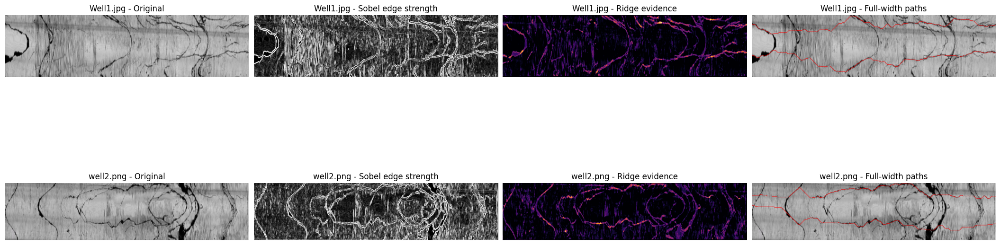

In [7]:
def process_image(record):
    """Run ridge construction and continuity tracking for one image record."""
    preprocessed = record["preprocessing"]["preprocessed"]

    dark_ridge = build_ridge_evidence(preprocessed, "dark")
    bright_ridge = build_ridge_evidence(preprocessed, "bright")

    dark_paths = trace_multiple_paths(dark_ridge["evidence"])
    bright_paths = trace_multiple_paths(bright_ridge["evidence"])

    polarity, dark_quality, bright_quality = select_polarity(dark_paths, bright_paths)
    selected_ridge = dark_ridge if polarity == "dark" else bright_ridge
    selected_paths = dark_paths if polarity == "dark" else bright_paths

    return {
        "dark_ridge": dark_ridge,
        "bright_ridge": bright_ridge,
        "dark_paths": dark_paths,
        "bright_paths": bright_paths,
        "selected_polarity": polarity,
        "selected_ridge": selected_ridge,
        "selected_paths": selected_paths,
        "dark_quality": dark_quality,
        "bright_quality": bright_quality,
    }


for record in image_records:
    record["tracking"] = process_image(record)

print(
    f"{'Image':12s} {'Polarity':>10s} {'Paths':>7s} "
    f"{'DP scores':>20s} {'Support':>18s}"
)
for record in image_records:
    tracking = record["tracking"]
    retained = tracking["selected_paths"]["retained"]
    score_text = ", ".join(f"{path['dp_score']:.2f}" for path in retained) or "-"
    support_text = ", ".join(f"{path['support_fraction']:.2f}" for path in retained) or "-"
    print(
        f"{record['name']:12s} {tracking['selected_polarity']:>10s} "
        f"{len(retained):7d} {score_text:>20s} {support_text:>18s}"
    )


def draw_centrelines(image_rgb, paths, thickness=None):
    overlay = image_rgb.copy()
    height, width = image_rgb.shape[:2]
    thickness = thickness or max(2, int(round(width / 1400)))

    for path in paths:
        points = np.column_stack([
            np.arange(width),
            path["rows"],
        ]).astype(np.int32)
        cv2.polylines(
            overlay,
            [points],
            isClosed=False,
            color=(255, 0, 0),
            thickness=thickness,
            lineType=cv2.LINE_AA,
        )
    return overlay


fig, axes = plt.subplots(len(graded_images), 4, figsize=(21, 7), constrained_layout=True)
for row, record in enumerate(graded_images):
    tracking = record["tracking"]
    retained = tracking["selected_paths"]["retained"]
    axes[row, 0].imshow(record["rgb"])
    axes[row, 1].imshow(tracking["selected_ridge"]["sobel_strength"], cmap="gray", vmin=0, vmax=1)
    axes[row, 2].imshow(tracking["selected_ridge"]["evidence"], cmap="inferno", vmin=0, vmax=2)
    axes[row, 3].imshow(draw_centrelines(record["rgb"], retained))

    titles = ["Original", "Sobel edge strength", "Ridge evidence", "Full-width paths"]
    for column, title in enumerate(titles):
        axes[row, column].set_title(f"{record['name']} - {title}")
        axes[row, column].axis("off")
plt.show()

## 2.3 Path-Detection Results

The diagnostic table reports the selected polarity, the number of retained paths, their average dynamic-programming scores, and their support fractions.

In the executed run, both graded images produced two accepted dark-polarity paths. These paths follow the dominant upper and lower fracture structures across the full width of the images. The support measurements show that most columns contain evidence consistent with the tracked curves.

The additional images produce between one and three accepted paths. Their number is not fixed manually and is not selected from the filename. It depends on the relative path scores, local evidence support, and maximum weak-gap condition.

The displayed centerlines are not yet the final segmentation. They represent the continuity decision of the algorithm and are intentionally thin. The visible fracture thickness is reconstructed in the next stage.

## 2.4 Local Fracture-Thickness Reconstruction

The dynamic-programming output provides a continuous fracture centerline but does not represent the full visible width of the fracture. Applying dilation alone would create a constant artificial thickness, while thresholding the complete ridge image would reintroduce unrelated micro-cracks.

Thickness is therefore reconstructed separately in every image column:

1. A narrow vertical search interval is placed around the accepted path.
2. The ridge response inside this interval is thresholded.
3. The threshold is the larger of:
   - a global percentile calculated from the complete positive ridge response
   - a local percentile calculated from the current column profile
4. Consecutive supported pixels form candidate vertical runs.
5. Only the run closest to the tracked centerline is retained.
6. The centerline is explicitly preserved through short low-contrast regions.
7. A small closing and dilation operation produce a compact final mask.

This procedure keeps the reconstructed mask close to a verified full-width path. A secondary crack cannot enter the result merely because it has a strong response elsewhere in the image.

The final output for each image contains:

- the binary primary-fracture mask
- a red overlay on the original image
- diagnostic intermediate stages

The masks and overlays are also saved in a ZIP archive.

In [8]:
def reconstruct_thickness(record):
    """
    Recover a compact binary fracture mask near the retained centerlines.
    """
    tracking = record["tracking"]
    retained_paths = tracking["selected_paths"]["retained"]

    response = cv2.GaussianBlur(
        tracking["selected_ridge"]["raw_response"].astype(np.uint8),
        (5, 5),
        0,
    )

    height, width = response.shape
    final_mask = np.zeros((height, width), dtype=np.uint8)
    centreline_mask = np.zeros_like(final_mask)
    search_radius = max(6, int(round(0.035 * height)))
    positive_response = response[response > 0]

    global_threshold = (float(np.percentile(positive_response,72))
        if positive_response.size
        else 255.0
    )

    local_thresholds = []

    for path in retained_paths:
        path_rows = path["rows"]
        path_threshold_values = []

        for column, path_row in enumerate(path_rows):
            centreline_mask[path_row,column] = 255

            row_start = max(0, path_row - search_radius)
            row_end = min(height, path_row + search_radius + 1)
            profile = response[row_start:row_end, column]
            positive_profile = profile[profile > 0]

            local_threshold = (float(np.percentile(positive_profile, 55))
                if positive_profile.size
                else global_threshold
            )

            effective_threshold = max(global_threshold, local_threshold)
            path_threshold_values.append(effective_threshold)
            supported = (profile >= effective_threshold)

            # Find consecutive supported vertical runs
            runs = []
            index = 0

            while index < len(supported):
                if not supported[index]:
                    index += 1
                    continue

                run_start = index

                while (index < len(supported) and supported[index]):
                    index += 1

                runs.append((run_start, index))

            if not runs:
                continue

            local_path_row = (path_row - row_start)

            def distance_to_run(run):
                run_start, run_end = run

                if (run_start <= local_path_row < run_end):
                    return 0

                return min(abs(local_path_row - run_start),
                    abs(local_path_row - (run_end - 1)))

            selected_start, selected_end = min(runs, key=distance_to_run)

            selected_distance = distance_to_run(
                (
                    selected_start,
                    selected_end,
                )
            )

            maximum_distance = max(3, 0.45 * search_radius)

            if selected_distance > maximum_distance:
                continue

            # Slightly expand the selected run
            selected_start = max(0, selected_start - 1)

            selected_end = min(len(profile), selected_end + 1)

            final_mask[
                row_start + selected_start:
                row_start + selected_end,
                column,
            ] = 255

        if path_threshold_values:
            local_thresholds.append(float(np.median(path_threshold_values)))

        # Preserve the continuous centerline through weak intervals
        points = np.column_stack([np.arange(width),path_rows]).astype(np.int32)

        cv2.polylines(
            final_mask,
            [points],
            isClosed=False,
            color=255,
            thickness=max(
                1,
                int(round(width / 2000)),
            ),
            lineType=cv2.LINE_8,
        )

    # Compact the selected fracture pixels
    cleanup_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3, 3))
    final_mask = cv2.morphologyEx(final_mask, cv2.MORPH_CLOSE, cleanup_kernel)
    final_mask = cv2.dilate(final_mask, cleanup_kernel, iterations=1)

    # Create a semi-transparent red overlay
    overlay = (
        record["rgb"]
        .astype(np.float32)
        .copy()
    )

    selected_pixels = final_mask > 0

    overlay[selected_pixels] = (
        0.58 * overlay[selected_pixels]
        + 0.42 * np.array([255, 0, 0], dtype=np.float32)
    )

    overlay = np.clip(overlay,0,255).astype(np.uint8)

    return {
        "response": response,
        "centrelines": centreline_mask,
        "mask": final_mask,
        "overlay": overlay,
        "global_threshold": global_threshold,
        "local_thresholds": local_thresholds,
        "search_radius": search_radius,
    }


# Reconstruct fracture thickness for every image
for record in image_records:
    record["segmentation"] = (reconstruct_thickness(record))

# Save all masks and overlays
output_dir = OUTPUT_DIR
if output_dir.exists():
    shutil.rmtree(output_dir)
output_dir.mkdir(parents=True, exist_ok=True)

for record in image_records:
    stem = Path(record["name"]).stem
    result = record["segmentation"]
    cv2.imwrite(str(output_dir / f"{stem}_primary_mask.png"),result["mask"])

    cv2.imwrite(
        str(output_dir / f"{stem}_primary_overlay.png"),
        cv2.cvtColor(result["overlay"], cv2.COLOR_RGB2BGR),
    )

print(f"Saved masks and overlays to: {output_dir}")


# Print a compact diagnostic summary
print(
    f"\n{'Image':12s} "
    f"{'Paths':>7s} "
    f"{'Global threshold':>18s} "
    f"{'Local thresholds':>24s} "
    f"{'Search radius':>14s}"
)

for record in image_records:
    segmentation = record["segmentation"]
    retained_paths = record["tracking"]["selected_paths"]["retained"]
    local_threshold_text = ", ".join(
        f"{threshold:.1f}"
        for threshold in segmentation["local_thresholds"]
    )

    if not local_threshold_text:
        local_threshold_text = "-"

    print(
        f"{record['name']:12s} "
        f"{len(retained_paths):7d} "
        f"{segmentation['global_threshold']:18.1f} "
        f"{local_threshold_text:>24s} "
        f"{segmentation['search_radius']:14d}"
    )

Saved masks and overlays to: /content/wellbore-fracture-segmentation/outputs

Image          Paths   Global threshold         Local thresholds  Search radius
Well1.jpg          2               62.0               62.9, 69.0             23
well2.png          2               56.0               56.0, 56.0             21
0153.png           2               19.0               19.0, 19.0             13
0170.png           1               55.0                     74.3             13
0176.png           3               59.0         64.3, 65.6, 59.0             13
0179.png           2               46.0               77.0, 62.0             13
0185.png           3               63.0         63.0, 63.0, 63.0             13
0188.png           1               61.0                     83.1             13
0190.png           2               52.0               55.2, 52.0             13
0197.png           2               77.0               79.2, 77.0             13


### Reconstruction Diagnostics


- **Paths** is the number of full-width fracture centerlines retained by the continuity analysis. It is determined automatically from the path scores and support conditions rather than being fixed for each image.
- **Global threshold** is calculated from the positive ridge-response values of the complete image. It removes generally weak texture before local thickness recovery.
- **Local thresholds** are calculated separately around each retained path. The effective threshold is the larger of the global and local values, so a path located in a strongly textured region must satisfy a stricter condition.
- **Search radius** defines the vertical neighbourhood examined around each centerline. It is scaled according to image height, which explains the larger values for the high-resolution graded images and the common value of 13 pixels for the smaller validation images.

For example, `Well1.jpg` and `well2.png` each contain two retained paths. Some validation images contain one path, while others contain two or three candidate structures. Equal global and local thresholds indicate that the global threshold was already sufficiently restrictive, whereas a larger local threshold indicates stronger surrounding texture or contrast near that path.

These values are internal adaptive parameters, not accuracy or confidence measurements.

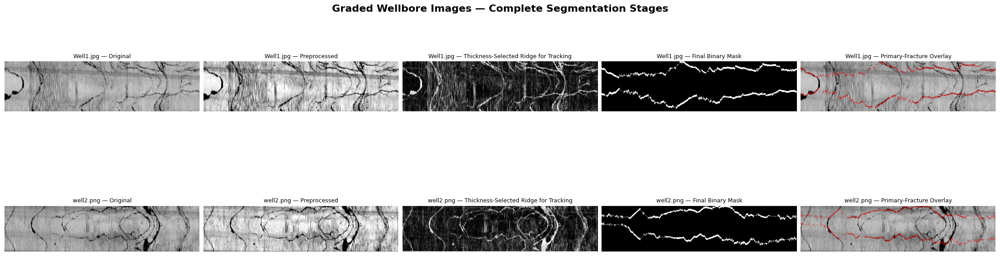

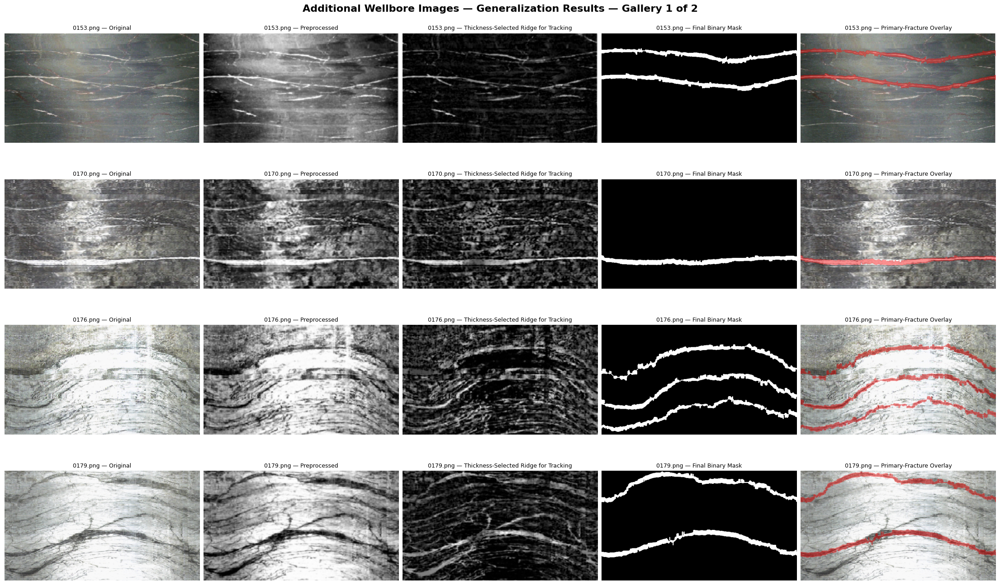

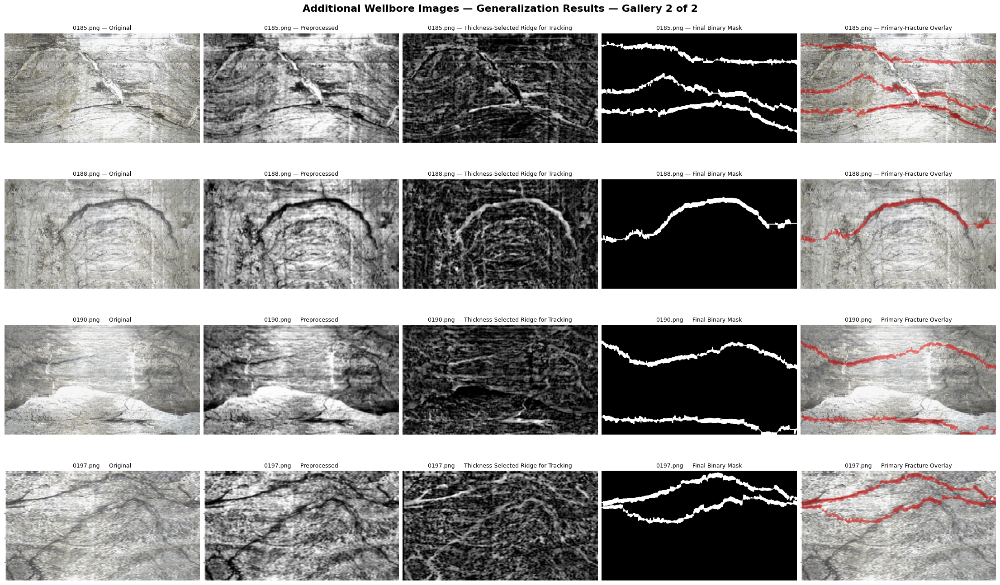

Created archive: /content/wellbore-fracture-segmentation/outputs.zip


In [9]:
# Helper function for displaying the same five stages
def show_segmentation_gallery(records,figure_title,rows_per_figure=None):
    if not records:
        return

    if rows_per_figure is None:
        rows_per_figure = len(records)

    number_of_figures = math.ceil(len(records) / rows_per_figure)

    for figure_index, start in enumerate(
        range(0, len(records), rows_per_figure),
        start=1,
    ):
        group = records[start:start + rows_per_figure]

        fig, axes = plt.subplots(
            len(group),
            5,
            figsize=(22, 3.3 * len(group)),
            constrained_layout=True,
            squeeze=False,
        )

        displayed_title = figure_title

        if number_of_figures > 1:
            displayed_title += (
                f" — Gallery {figure_index} of {number_of_figures}"
            )

        fig.suptitle(displayed_title, fontsize=16, fontweight="bold")

        for row, record in enumerate(group):
            tracking = record["tracking"]
            segmentation = record["segmentation"]

            # Original image
            axes[row, 0].imshow(record["rgb"])

            # Final preprocessed image
            axes[row, 1].imshow(
                record["preprocessing"]["preprocessed"],
                cmap="gray",
                vmin=0,
                vmax=255,
            )

            # Thickness-Selected Ridge for Tracking
            axes[row, 2].imshow(
                tracking["selected_ridge"]["thick_response"],
                cmap="gray",
            )

            # Final binary mask
            axes[row, 3].imshow(
                segmentation["mask"],
                cmap="gray",
                vmin=0,
                vmax=255,
            )

            # Final red overlay
            axes[row, 4].imshow(segmentation["overlay"])

            stage_titles = [
                "Original",
                "Preprocessed",
                "Thickness-Selected Ridge for Tracking",
                "Final Binary Mask",
                "Primary-Fracture Overlay",
            ]

            for column, stage_title in enumerate(stage_titles):
                axes[row, column].set_title(
                    f"{record['name']} — "
                    f"{stage_title}",
                    fontsize=9,
                )

                axes[row, column].axis("off")

        plt.show()


# Show the complete five-stage output for graded images
show_segmentation_gallery(
    graded_images,
    figure_title=("Graded Wellbore Images — Complete Segmentation Stages"),
)

# Show the same five stages for all validation images
show_segmentation_gallery(
    validation_images,
    figure_title=("Additional Wellbore Images — Generalization Results"),
    rows_per_figure=4,
)

# Create a ZIP archive containing every mask and overlay
archive_path = shutil.make_archive(str(PROJECT_DIR / "outputs"), "zip", output_dir)

print(f"Created archive: {archive_path}")

## 2.5 Evaluation and Limitations

The final masks for `Well1.jpg` and `well2.png` remain concentrated around two dominant horizontally continuous structures. Compared with direct ridge thresholding, the continuity-first method suppresses most isolated micro-cracks and prevents dense texture from filling large parts of the mask.

The same pipeline is also applied to all eight additional images without changing parameters for individual files. The validation results show that the adaptive kernel sizes and path constraints can handle different image resolutions and both dark and bright fracture structures. The number of selected paths varies according to the measured evidence rather than a fixed assumption.

No manually annotated ground-truth masks are available. Therefore, accuracy, precision, or recall cannot be reported, and the red overlays should not be interpreted as verified geological labels. They are **candidate primary-fracture segmentations** that satisfy the selected image-processing criteria:

- relatively strong ridge evidence
- morphological thickness
- smooth full-width continuity
